# Crime Chloropleth


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json

In [2]:
df = pd.read_csv(
    "../../data/clean/DelitosTipo1/DelitosTipo1-2010-2020.csv",
    index_col=0,
    na_values=["(NA)"],
).fillna(0)
df["Year"] = pd.DatetimeIndex(df["Date"]).year
df["Month"] = pd.DatetimeIndex(df["Date"]).month
df["Date"] = pd.to_datetime(df["Date"], format="%Y-%m")
df.insert(0, "Date", df.pop("Date"))

We fetch the GeoJSON data for the chloropleth.


In [3]:
with open("./municipalities.geojson", "r") as file:
    geojson = json.load(file)

We normalize the data.


In [17]:
df.loc[df["Date"].dt.month == 12].shape

from sklearn.preprocessing import MinMaxScaler

# Use only the end of aggregate
only_last = df.loc[df["Date"].dt.month == 12]

scaler = MinMaxScaler()
only_last[["Tipo I"]] = scaler.fit_transform(only_last[["Tipo I"]])
only_last

/tmp/ipykernel_98761/1646509815.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date,Distrito,Tipo I,Ases.,Viol.,Robo,Agr. Grave,Esc.,Apr. I,H. Auto,Year,Month
858,2010-12-01,Aguada,0.037259,2.0,1.0,22.0,30.0,178.0,178,29.0,2010,12
859,2010-12-01,Aguas Buenas,0.022784,6.0,0.0,49.0,36.0,120.0,43,24.0,2010,12
860,2010-12-01,Ponce,0.302806,80.0,5.0,296.0,212.0,735.0,1870,214.0,2010,12
861,2010-12-01,Peñuelas,0.018049,4.0,1.0,23.0,24.0,84.0,79,10.0,2010,12
862,2010-12-01,Patillas,0.025286,5.0,0.0,13.0,18.0,101.0,161,8.0,2010,12
...,...,...,...,...,...,...,...,...,...,...,...,...
10291,2020-12-01,Orocovis,0.004646,1.0,1.0,1.0,11.0,23.0,35,3.0,2020,12
10292,2020-12-01,Patillas,0.003842,2.0,2.0,2.0,21.0,17.0,21,1.0,2020,12
10293,2020-12-01,Ponce,0.065315,24.0,3.0,32.0,186.0,125.0,365,18.0,2020,12
10294,2020-12-01,Mayagüez,0.019478,15.0,4.0,8.0,58.0,47.0,93,16.0,2020,12


In [18]:
# turning into string so that plotly can use it as an animation frame
only_last['Date'] = only_last['Date'].dt.strftime('%Y-%m-%d')

/tmp/ipykernel_98761/956478919.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [19]:
only_last

,Date,Distrito,Tipo I,Ases.,Viol.,Robo,Agr. Grave,Esc.,Apr. I,H. Auto,Year,Month
858,2010-12-01,Aguada,0.037259,2.0,1.0,22.0,30.0,178.0,178,29.0,2010,12
859,2010-12-01,Aguas Buenas,0.022784,6.0,0.0,49.0,36.0,120.0,43,24.0,2010,12
860,2010-12-01,Ponce,0.302806,80.0,5.0,296.0,212.0,735.0,1870,214.0,2010,12
861,2010-12-01,Peñuelas,0.018049,4.0,1.0,23.0,24.0,84.0,79,10.0,2010,12
862,2010-12-01,Patillas,0.025286,5.0,0.0,13.0,18.0,101.0,161,8.0,2010,12
...,...,...,...,...,...,...,...,...,...,...,...,...
10291,2020-12-01,Orocovis,0.004646,1.0,1.0,1.0,11.0,23.0,35,3.0,2020,12
10292,2020-12-01,Patillas,0.003842,2.0,2.0,2.0,21.0,17.0,21,1.0,2020,12
10293,2020-12-01,Ponce,0.065315,24.0,3.0,32.0,186.0,125.0,365,18.0,2020,12
10294,2020-12-01,Mayagüez,0.019478,15.0,4.0,8.0,58.0,47.0,93,16.0,2020,12


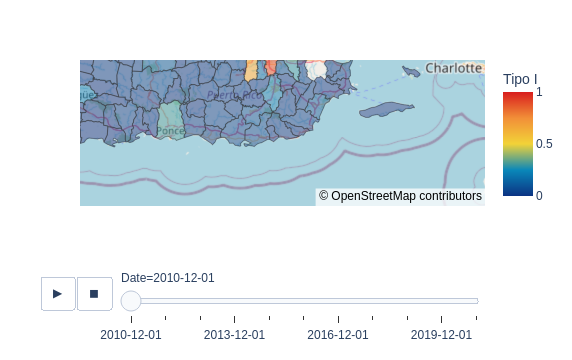

In [20]:
import plotly.express as px

fig = px.choropleth_mapbox(
    only_last,
    mapbox_style="open-street-map",
    geojson=geojson,
    locations="Distrito",
    featureidkey="properties.NAME",
    color="Tipo I",
    color_continuous_scale="portland",
    range_color=[0,1], # This keeps the scale the same for all frames
    opacity=0.5,
    animation_frame="Date",
    center=dict(lat=18.0, lon=-66),
    zoom=7,
)
fig.show()